In [1]:
# initial imports
import matplotlib.pyplot as plt
import hvplot.pandas
import panel as pn
import plotly.express as px
import plotly.graph_objects as go
import bitcoinanalyzer as ba
from address_type import address_type as adt
from supply_enum import supply_duration as sd
from transactions_type import transactions_type as tt
import api_class as ac
%matplotlib inline

# Initialize the Panel Extensions (for Plotly)
pn.extension('plotly')

In [2]:
analyzer=ba.bitcoinanalyzer()

# This service class is used to fetch bitcoin data from GlassNode API for analysis. In the process we had to convert the datetime value from Unix timestamp to 
# a readable datetime value and renamed the JSON schema to more understandable dataframe. In this case JSON was returned as {'t':'unixt imestamp','v':'value'}
# to {'Date':'DateTime',''}
apisvc=ac.apiservice()

In [4]:
#Fetch SOPR data from glassnode
sopr_data=apisvc.get_spentoutputprofitratio(symbol='BTC',from_date='2010-10-01',to_date='2019-10-01')

#Fetch NVT ratio from glassnode
nvt_ratio_data=apisvc.get_nvtratio(symbol='BTC',from_date='2010-10-01',to_date='2019-10-01')

#Fetch Market Cap data from glassnode
market_cap_data=apisvc.get_marketcap(symbol='BTC',from_date='2010-10-01',to_date='2019-10-01')


#Fetch the number of unique addresses that appeared for the first time in a transaction of the native coin in the network.
number_of_newaddress=apisvc.get_addresses(symbol='BTC',addresstype=adt.New_Non_Zero_Count,from_date='2010-10-01',to_date='2019-10-01')
number_of_newaddress['AddressMetrics']=adt.New_Non_Zero_Count.name
non_zero_coins=apisvc.get_addresses(symbol='BTC',addresstype=adt.Non_Zero_Count,from_date='2010-10-01',to_date='2019-10-01')
non_zero_coins['AddressMetrics']=adt.Non_Zero_Count.name
min_10k_coins=apisvc.get_addresses(symbol='BTC',addresstype=adt.Min_10k_Count,from_date='2010-10-01',to_date='2019-10-01')
min_10k_coins['AddressMetrics']=adt.Min_10k_Count.name
min_1_coin=apisvc.get_addresses(symbol='BTC',addresstype=adt.Min_Point_1_Count,from_date='2010-10-01',to_date='2019-10-01')
min_1_coin['AddressMetrics']=adt.Min_Point_1_Count.name

#Fetch Transction data from glassnode
trans_volume_sum=apisvc.get_transactions(symbol='BTC',transactiontype=tt.Transfers_Volume_Sum,from_date='2010-10-01',to_date='2019-10-01')
trans_volume_sum['Type']=tt.Transfers_Volume_Sum.name
trans_volume_mean=apisvc.get_transactions(symbol='BTC',transactiontype=tt.Transfers_Volume_Mean,from_date='2010-10-01',to_date='2019-10-01')
trans_volume_mean['Type']=tt.Transfers_Volume_Mean.name
trans_volume_median=apisvc.get_transactions(symbol='BTC',transactiontype=tt.Transfers_Volume_Median,from_date='2010-10-01',to_date='2019-10-01')
trans_volume_median['Type']=tt.Transfers_Volume_Median.name
trans_volume_adj_sum=apisvc.get_transactions(symbol='BTC',transactiontype=tt.Transfers_Volume_Adjusted_Sum,from_date='2010-10-01',to_date='2019-10-01')
trans_volume_adj_sum['Type']=tt.Transfers_Volume_Adjusted_Sum.name
trans_volume_adj_mean=apisvc.get_transactions(symbol='BTC',transactiontype=tt.Transfers_Volume_Adjusted_Mean,from_date='2010-10-01',to_date='2019-10-01')
trans_volume_adj_mean['Type']=tt.Transfers_Volume_Adjusted_Mean.name
trans_volume_adj_median=apisvc.get_transactions(symbol='BTC',transactiontype=tt.Transfers_Volume_Adjusted_Median,from_date='2010-10-01',to_date='2019-10-01')
trans_volume_adj_median['Type']=tt.Transfers_Volume_Adjusted_Median.name


In [5]:
trans_volume_adj_data=analyzer.concat_dataframes([trans_volume_adj_sum,trans_volume_adj_mean,trans_volume_adj_median],axisvalue='index')
trans_volume_adj_sum

,Date,Value,Symbol,Type
0,2010-09-30,65973.348121,BTC,Transfers_Volume_Adjusted_Sum
1,2010-10-01,368886.747768,BTC,Transfers_Volume_Adjusted_Sum
2,2010-10-02,81854.037766,BTC,Transfers_Volume_Adjusted_Sum
3,2010-10-03,563662.890001,BTC,Transfers_Volume_Adjusted_Sum
4,2010-10-04,200021.780000,BTC,Transfers_Volume_Adjusted_Sum
...,...,...,...,...
3282,2019-09-25,617943.577995,BTC,Transfers_Volume_Adjusted_Sum
3283,2019-09-26,629220.782174,BTC,Transfers_Volume_Adjusted_Sum
3284,2019-09-27,436234.279274,BTC,Transfers_Volume_Adjusted_Sum
3285,2019-09-28,412139.812041,BTC,Transfers_Volume_Adjusted_Sum


In [6]:
#Plot supply data
def create_historical_supply_plot():
    supply_data=analyzer.concat_dataframes([one_twoyears_supply_data,two_threeyears_supply_data,more_fiveyears_supply_data],axisvalue='index')
    fig = px.line(data_frame=supply_data
                  ,x='Date'
                  ,y='Value'
                  ,color='Duration')
    fig.update_layout(title='Active BTC Supply',xaxis_title='Year',yaxis_title='Active Supply')
    fig.show()

def create_current_supply_plot():
    fig = px.line(data_frame=current_supply_data
                  ,x='Date'
                  ,y='Value'
                  ,color='Duration')
    fig.update_layout(title='Current BTC Supply',xaxis_title='Year',yaxis_title='Current Supply')
    fig.show()

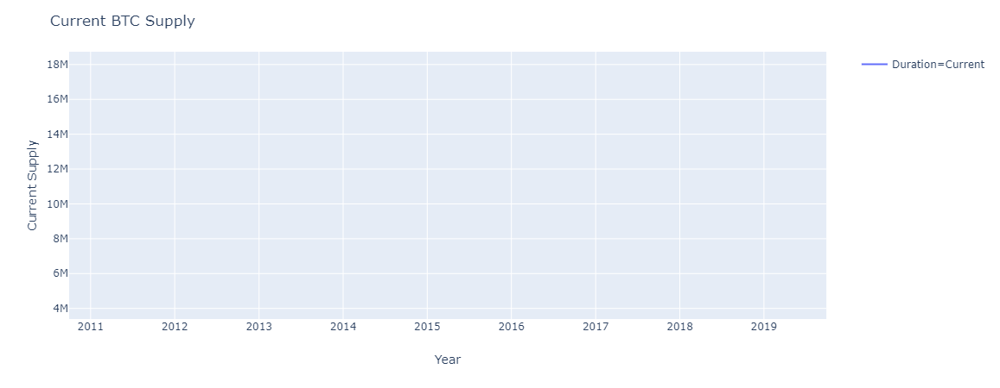

In [7]:
create_current_supply_plot()

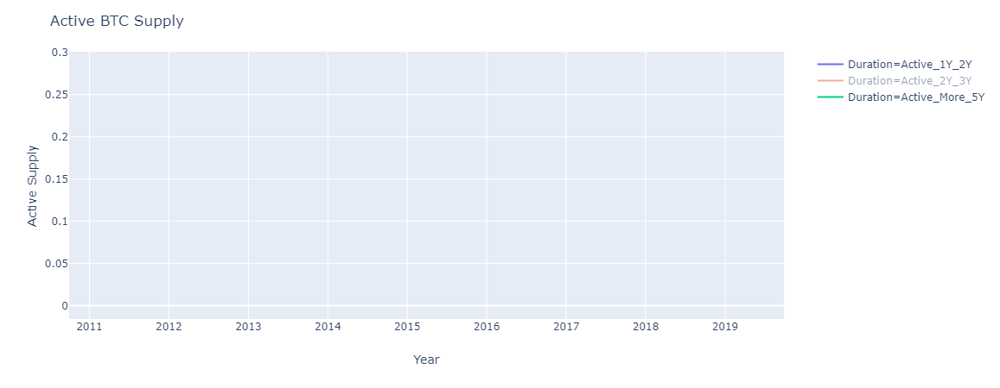

In [21]:
create_historical_supply_plot()

In [9]:
#Plot Transactions data
def create_trans_volume_sum_plot():
    trans_volume_data=analyzer.concat_dataframes([trans_volume_sum,trans_volume_adj_sum],axisvalue='index')
    fig = px.line(data_frame=trans_volume_data,x='Date',y='Value',color='Type')
    fig.update_layout(title='Volume/Adj. Volume (Total)',xaxis_title='Year',yaxis_title='Volume')
    fig.show()
    

def create_trans_volume_mean_plot():
    trans_volume_data=analyzer.concat_dataframes([trans_volume_mean,trans_volume_adj_mean],axisvalue='index')
    fig = px.line(data_frame=trans_volume_data,x='Date',y='Value',color='Type')
    fig.update_layout(title='Volume/Adj. Volume (Mean)',xaxis_title='Year',yaxis_title='Volume')
    fig.show()

def create_trans_volume_median_plot():
    trans_volume_data=analyzer.concat_dataframes([trans_volume_median,trans_volume_adj_median],axisvalue='index')
    fig = px.line(data_frame=trans_volume_data,x='Date',y='Value',color='Type')
    fig.update_layout(title='Volume/Adj. Volume (Median)',xaxis_title='Year',yaxis_title='Volume')
    fig.show()

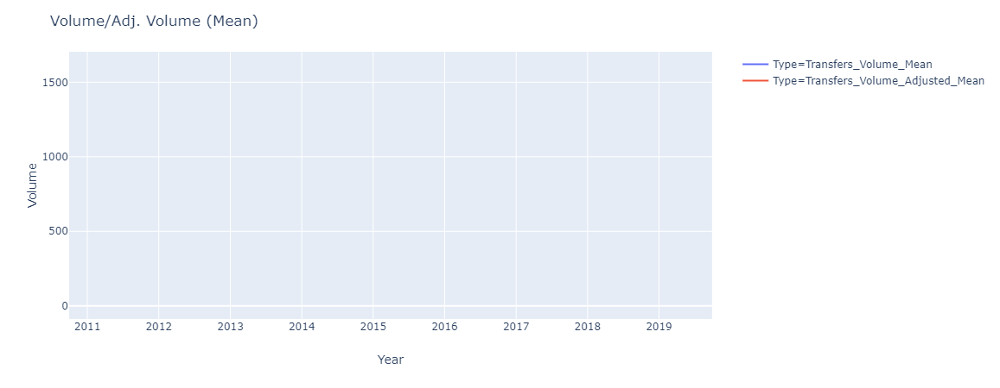

In [22]:
create_trans_volume_mean_plot()

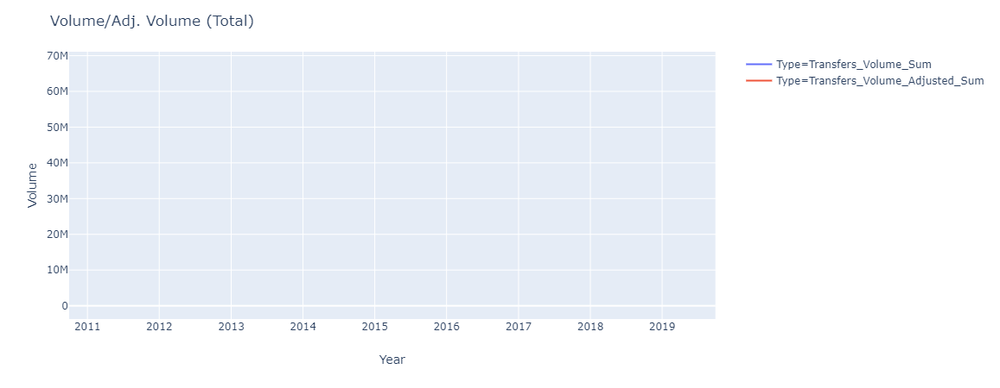

In [23]:
create_trans_volume_sum_plot()

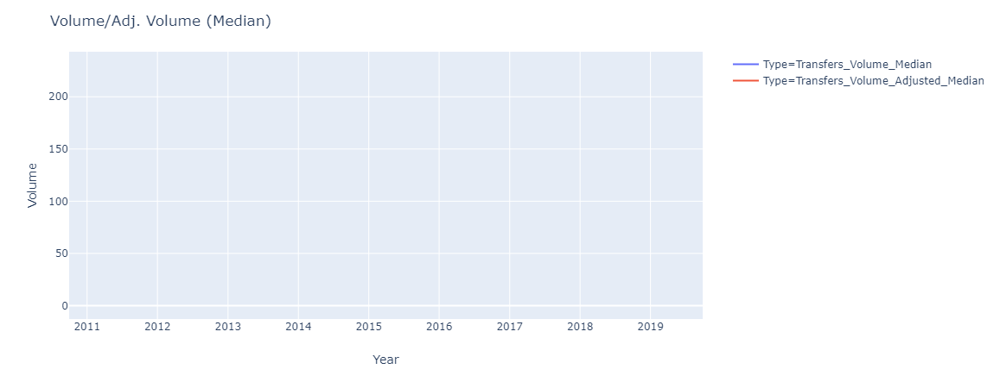

In [24]:
create_trans_volume_median_plot()

In [13]:
#Plot Address
def create_address_plot():
    address_data=analyzer.concat_dataframes([number_of_newaddress,non_zero_coins,min_1_coin],axisvalue='index')
    fig = px.line(data_frame=address_data,x='Date',y='Value',color='AddressMetrics')
    fig.update_layout(title='BTC Addresses',xaxis_title='Year',yaxis_title='Address Count')
    fig.show()
def create_address_min_10K_plot():
    fig = px.line(data_frame=min_10k_coins,x='Date',y='Value',color='AddressMetrics')
    fig.update_layout(title='Addresses with Balance ≥ 10k',xaxis_title='Year',yaxis_title='Address Count')
    fig.show()

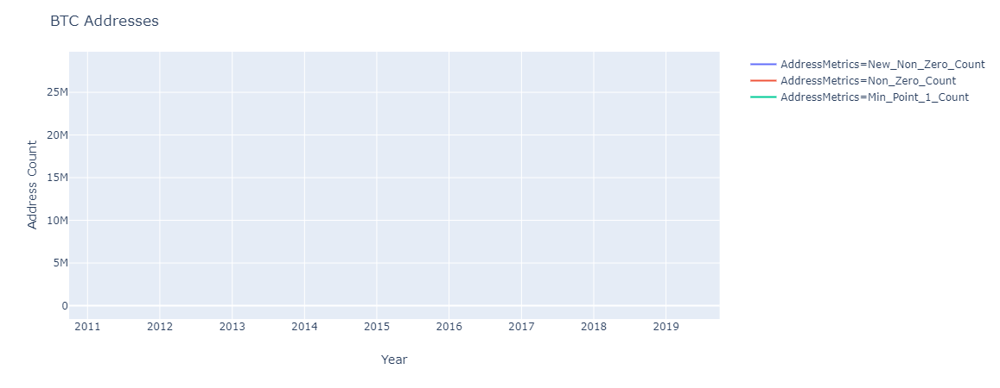

In [25]:
create_address_plot()

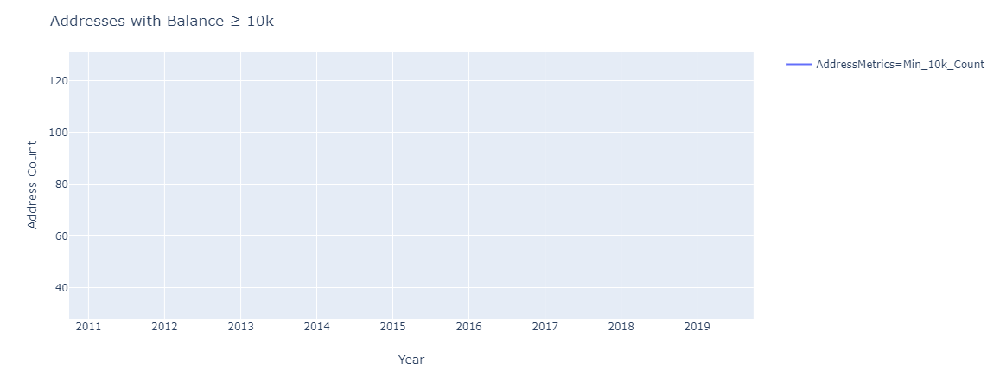

In [26]:
create_address_min_10K_plot()

In [16]:
#Plot SOPR
def create_sopr_plot():
    fig = px.line(data_frame=sopr_data,x='Date',y='Value',title='BTC SOPR')
    fig.update_layout(xaxis_title='Year',yaxis_title='Spent Output Profit Ratio')
    fig.show()

def create_nvt_ratio_plot():
    fig = px.line(data_frame=nvt_ratio_data,x='Date',y='Value',title='Network Value to Transactions Ratio')
    fig.update_layout(xaxis_title='Year',yaxis_title='NVT Ratio')
    fig.show()

def create_market_cap_plot():
    fig = px.line(data_frame=market_cap_data,x='Date',y='Value',title='BTC Market Cap')
    fig.update_layout(xaxis_title='Year',yaxis_title='Market Cap')
    fig.show()

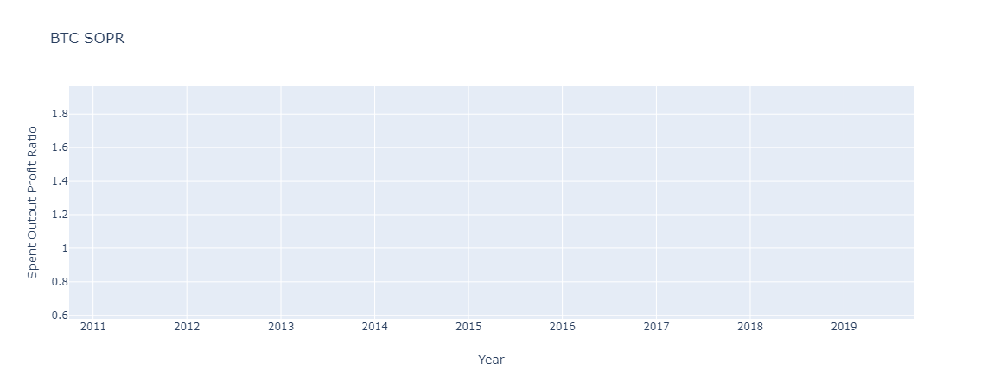

In [17]:
create_sopr_plot()

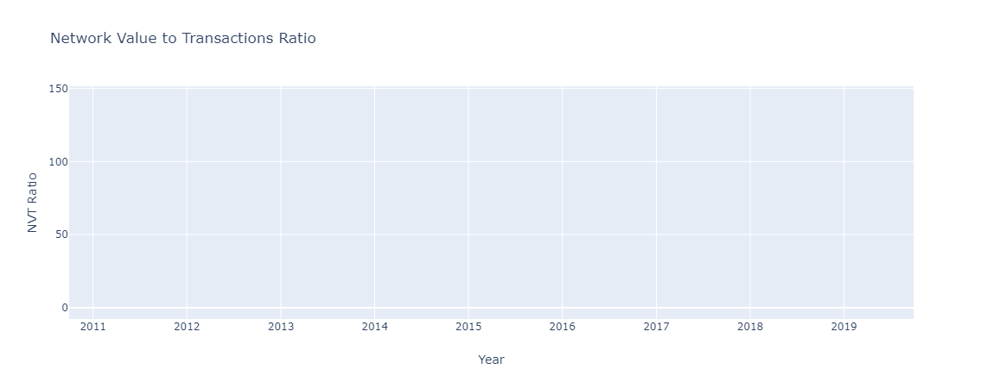

In [18]:
create_nvt_ratio_plot()

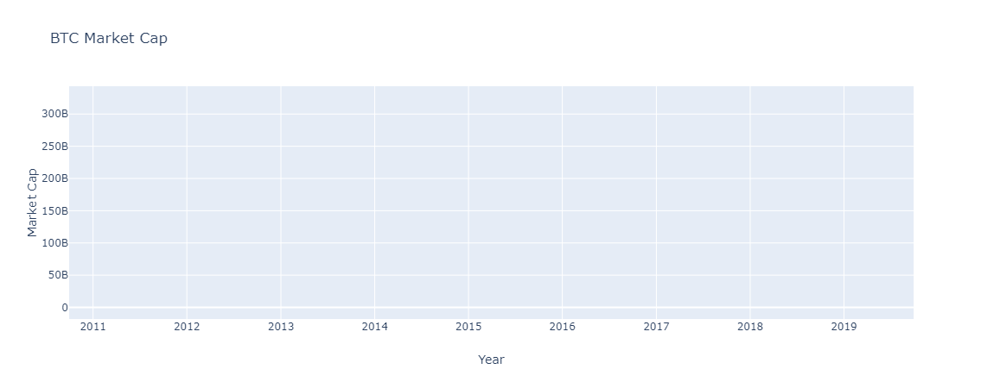

In [19]:
create_market_cap_plot()